# LightGlue Demo
In this notebook we match two pairs of images using LightGlue with early stopping and point pruning.

In [2]:
# If we are on colab: this clones the repo and installs the dependencies
from pathlib import Path

#if Path.cwd().name != "LightGlue":
#    !git clone --quiet https://github.com/cvg/LightGlue/
#    %cd LightGlue
#    !pip install --progress-bar off --quiet -e .

from lightglue import LightGlue, SuperPoint, DISK ,SIFT, ALIKED, DoGHardNet,superglue
from lightglue.utils import load_image, rbd
from lightglue import viz2d
from lightglue import match_pair
import torch
import matplotlib.pyplot as plt

torch.set_grad_enabled(False)
images = Path("assets")

## Load extractor and matcher module
In this example we use SuperPoint features combined with LightGlue.

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 'mps', 'cpu'

extractor = SuperPoint(max_num_keypoints=2048).eval().to(device)  # load the extractor
matcher = LightGlue(features="superpoint").eval().to(device)

torch.Size([755, 2])
Number of accurate matches: 609


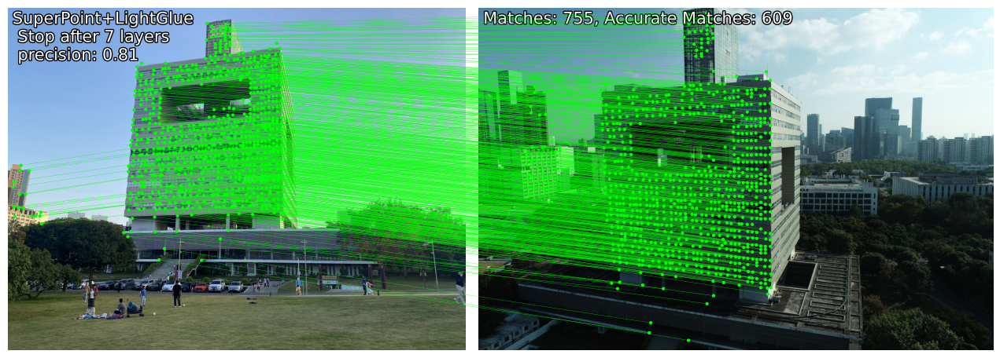

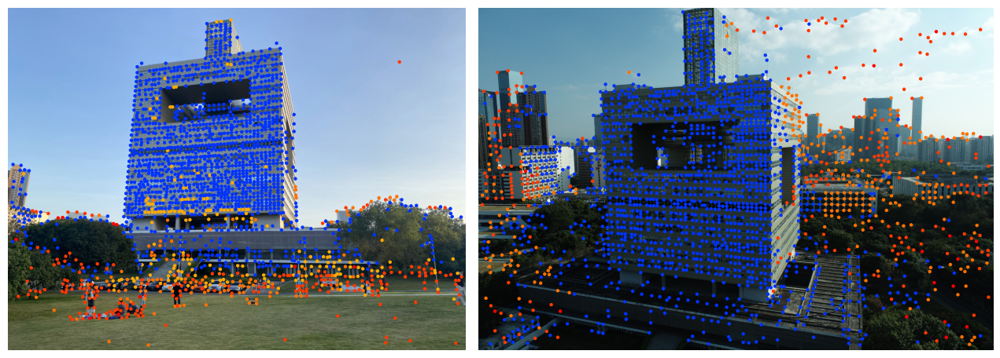

In [4]:
extractor = SuperPoint(max_num_keypoints=2048).eval().cuda()  # load the extractor
matcher = LightGlue(features='superpoint').eval().cuda()  # load the matcher
image0 = load_image(images / "2_8686.jpg").cuda()
image1 = load_image(images / "frame_00184.JPG").cuda()
#image0 = load_image(images / "dark.jpg").cuda()
#image1 = load_image(images / "light.jpg").cuda()

feats0, feats1, matches01 = match_pair(extractor, matcher, image0, image1)

# 从feats0和feats1中获取关键点和matches，然后根据matches获取匹配的关键点
kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

print(matches.shape)

import cv2
cc = 1.3  # 设置比值 
# 遍历所有匹配对
# 计算每个匹配对的距离，如果距离小于比值乘以第二个距离，则认为是有效匹配
# 这里的比值可以自己设置，越大则匹配越精确，但是也会消耗更多的时间
# ----------------------------------------------
# 应用比值测试，筛选出最佳匹配
good_matches = []
import numpy as np
descriptors0, descriptors1 = feats0["descriptors"], feats1["descriptors"]

# 遍历所有匹配对，并应用比值测试

for idx, (m_idx, n_idx) in enumerate(matches):
    distance = np.linalg.norm(descriptors0[m_idx] - descriptors1[n_idx])
    
    # 查找次佳匹配
    other_distances = np.linalg.norm(descriptors0[m_idx] - descriptors1, axis=1)
    other_distances = np.sort(other_distances)
    second_best_distance = other_distances[1]  # 由于第一个是自身的距离，第二个是次佳距离

    if distance < cc * second_best_distance:
        good_matches.append((m_idx, n_idx))



num_accurate_matches=len(good_matches)

print(f"Number of accurate matches: {num_accurate_matches}")
# 统计匹配的数量以及准确匹配的数量
num_matches = matches.shape[0]

accuracy = num_accurate_matches / num_matches

# 调用viz2d.plot_images显示image0和image1，然后调用viz2d.plot_matches显示匹配的关键点
axes = viz2d.plot_images([image0, image1])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'SuperPoint+LightGlue\n Stop after {matches01["stop"]} layers\n precision: {accuracy:.2f}')
viz2d.add_text(1, f'Matches: {num_matches}, Accurate Matches: {num_accurate_matches}')
viz2d.save_plot("output/superpoint_lightglue_test.png")

# 通过prune0和prune1进行关键点修剪，然后调用viz2d.plot_images和viz2d.plot_keypoints显示修剪后的关键点
kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images([image0, image1])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)
viz2d.save_plot("output/superpoint_lightglue_test_pruned.png")




torch.Size([768, 2])
Number of accurate matches: 763


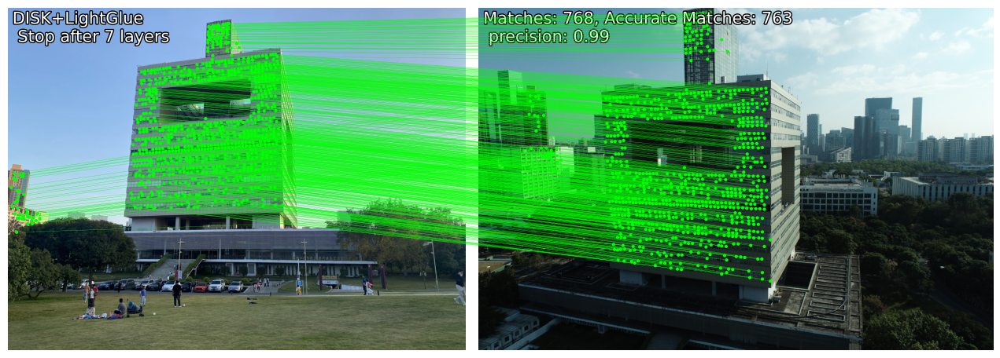

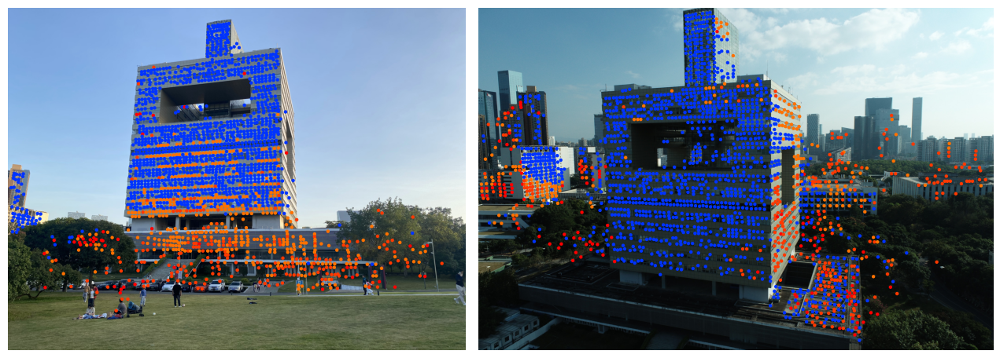

In [5]:
extractor = DISK(max_num_keypoints=2048).eval().cuda()  # load the extractor
matcher = LightGlue(features='disk').eval().cuda()  # load the matcher
image0 = load_image(images / "2_8686.jpg").cuda()
image1 = load_image(images / "frame_00184.JPG").cuda()
#image0 = load_image(images / "dark.jpg").cuda()
#image1 = load_image(images / "light.jpg").cuda()

feats0, feats1, matches01 = match_pair(extractor, matcher, image0, image1)

# 从feats0和feats1中获取关键点和matches，然后根据matches获取匹配的关键点
kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

print(matches.shape)

import cv2
cc = 1.3  # 设置比值 
# 遍历所有匹配对
# 计算每个匹配对的距离，如果距离小于比值乘以第二个距离，则认为是有效匹配
# 这里的比值可以自己设置，越大则匹配越精确，但是也会消耗更多的时间
# ----------------------------------------------
# 应用比值测试，筛选出最佳匹配
good_matches = []
import numpy as np
descriptors0, descriptors1 = feats0["descriptors"], feats1["descriptors"]

# 遍历所有匹配对，并应用比值测试

for idx, (m_idx, n_idx) in enumerate(matches):
    distance = np.linalg.norm(descriptors0[m_idx] - descriptors1[n_idx])
    
    # 查找次佳匹配
    other_distances = np.linalg.norm(descriptors0[m_idx] - descriptors1, axis=1)
    other_distances = np.sort(other_distances)
    second_best_distance = other_distances[1]  # 由于第一个是自身的距离，第二个是次佳距离

    if distance < cc * second_best_distance:
        good_matches.append((m_idx, n_idx))



num_accurate_matches=len(good_matches)

print(f"Number of accurate matches: {num_accurate_matches}")
# 统计匹配的数量以及准确匹配的数量
num_matches = matches.shape[0]


accuracy = num_accurate_matches / num_matches
# 调用viz2d.plot_images显示image0和image1，然后调用viz2d.plot_matches显示匹配的关键点
axes = viz2d.plot_images([image0, image1])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'DISK+LightGlue\n Stop after {matches01["stop"]} layers')
viz2d.add_text(1, f'Matches: {num_matches}, Accurate Matches: {num_accurate_matches}\n precision: {accuracy:.2f}')
viz2d.save_plot("output/DISK_lightglue_test.png")

# 通过prune0和prune1进行关键点修剪，然后调用viz2d.plot_images和viz2d.plot_keypoints显示修剪后的关键点
kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images([image0, image1])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)
viz2d.save_plot("output/DISK_lightglue_test_pruned.png")




torch.Size([92, 2])
Number of accurate matches: 56


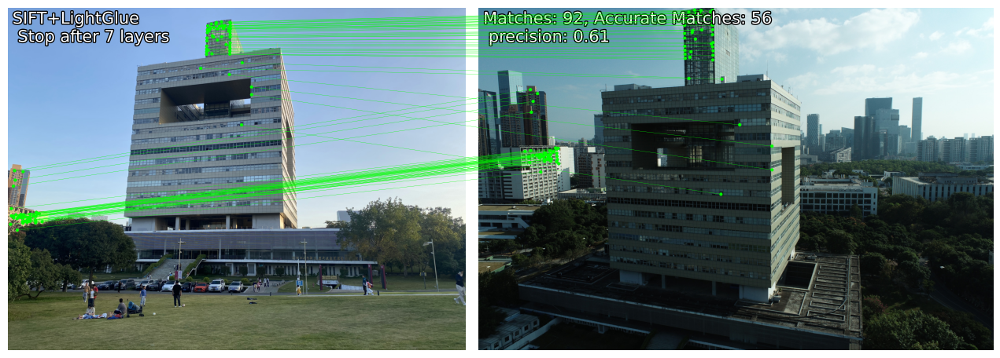

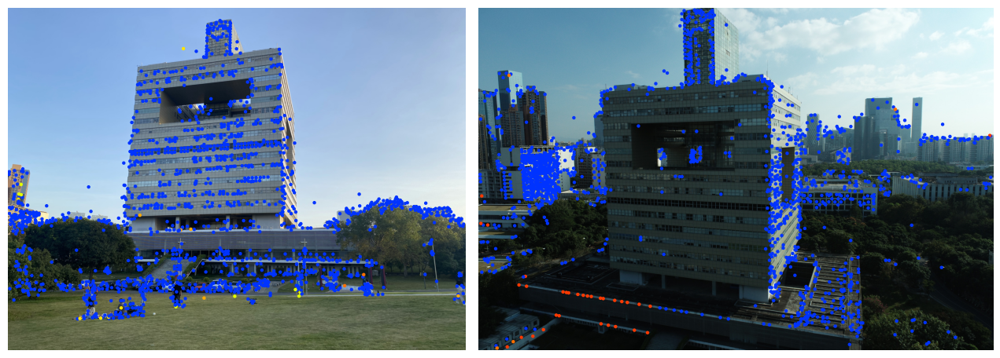

In [6]:
extractor = SIFT(max_num_keypoints=2048).eval().cuda()  # load the extractor
matcher = LightGlue(features='sift').eval().cuda()  # load the matcher
image0 = load_image(images / "2_8686.jpg").cuda()
image1 = load_image(images / "frame_00184.JPG").cuda()
#image0 = load_image(images / "dark.jpg").cuda()
#image1 = load_image(images / "light.jpg").cuda()

feats0, feats1, matches01 = match_pair(extractor, matcher, image0, image1)

# 从feats0和feats1中获取关键点和matches，然后根据matches获取匹配的关键点
kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

print(matches.shape)

import cv2
cc = 1.3  # 设置比值 
# 遍历所有匹配对
# 计算每个匹配对的距离，如果距离小于比值乘以第二个距离，则认为是有效匹配
# 这里的比值可以自己设置，越大则匹配越精确，但是也会消耗更多的时间
# ----------------------------------------------
# 应用比值测试，筛选出最佳匹配
good_matches = []
import numpy as np
descriptors0, descriptors1 = feats0["descriptors"], feats1["descriptors"]

# 遍历所有匹配对，并应用比值测试

for idx, (m_idx, n_idx) in enumerate(matches):
    distance = np.linalg.norm(descriptors0[m_idx] - descriptors1[n_idx])
    
    # 查找次佳匹配
    other_distances = np.linalg.norm(descriptors0[m_idx] - descriptors1, axis=1)
    other_distances = np.sort(other_distances)
    second_best_distance = other_distances[1]  # 由于第一个是自身的距离，第二个是次佳距离

    if distance < cc * second_best_distance:
        good_matches.append((m_idx, n_idx))



num_accurate_matches=len(good_matches)

print(f"Number of accurate matches: {num_accurate_matches}")
# 统计匹配的数量以及准确匹配的数量
num_matches = matches.shape[0]

accuracy = num_accurate_matches / num_matches

# 调用viz2d.plot_images显示image0和image1，然后调用viz2d.plot_matches显示匹配的关键点
axes = viz2d.plot_images([image0, image1])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'SIFT+LightGlue\n Stop after {matches01["stop"]} layers')
viz2d.add_text(1, f'Matches: {num_matches}, Accurate Matches: {num_accurate_matches}\n precision: {accuracy:.2f}')
viz2d.save_plot("output/SIFT_lightglue_test.png")

# 通过prune0和prune1进行关键点修剪，然后调用viz2d.plot_images和viz2d.plot_keypoints显示修剪后的关键点
kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images([image0, image1])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)
viz2d.save_plot("output/SIFT_lightglue_test_pruned.png")




Total matches: 755
Number of accurate matches: 609
Matching accuracy: 0.81
Rotation:
[[ 0.99407541 -0.09040174 -0.06034571]
 [ 0.10469798  0.94553819  0.30821399]
 [ 0.0291961  -0.31270602  0.94940114]]
Translation:
[[0.58525481]
 [0.54420026]
 [0.60110139]]
Pose estimation results saved to output/pose_estimation.txt


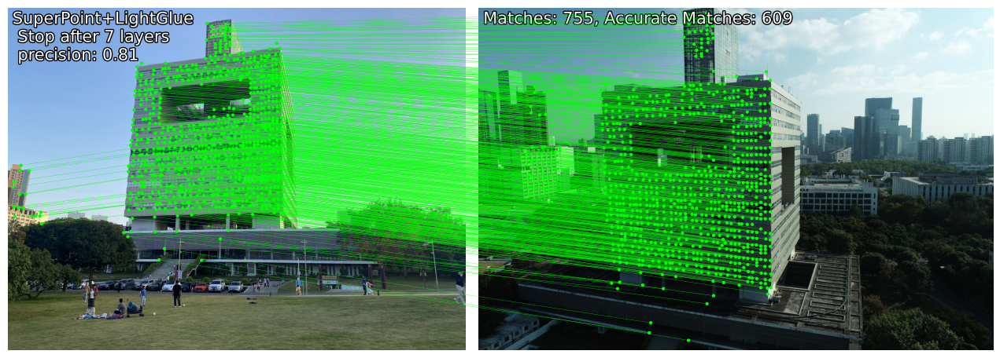

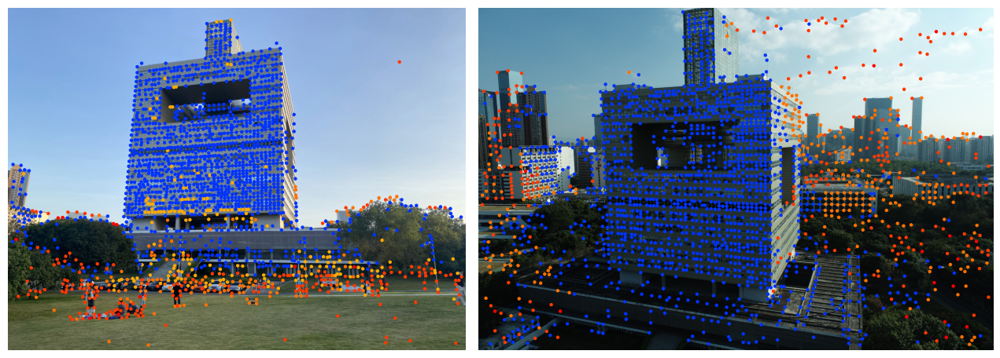

In [8]:
import torch
import numpy as np
from pathlib import Path
from hloc.models.superpoint import SuperPoint  # 假设你有一个SuperPoint模块
from lightglue import LightGlue, SuperPoint, DISK ,SIFT, ALIKED, DoGHardNet,superglue   # 假设你有一个LightGlue模块
from lightglue.utils import load_image, rbd     # 假设你有一个utils模块，其中有load_image和viz2d函数
import cv2

# 加载模型
extractor = SuperPoint(max_num_keypoints=2048).eval().cuda()
matcher = LightGlue(features='superpoint').eval().cuda()

# 加载图像
images = Path("assets")
image0 = load_image(images / "2_8686.jpg").cuda()
image1 = load_image(images / "frame_00184.JPG").cuda()

# 提取特征并匹配
feats0, feats1, matches01 = match_pair(extractor, matcher, image0, image1)

# 获取关键点和匹配
kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

# 打印匹配对的数量
print(f"Total matches: {matches.shape[0]}")

# 比值测试筛选最佳匹配
cc = 0.75  # 比值阈值
good_matches = []
descriptors0, descriptors1 = feats0["descriptors"], feats1["descriptors"]

for m_idx, n_idx in matches:
    distance = np.linalg.norm(descriptors0[m_idx] - descriptors1[n_idx])
    
    # 查找次佳匹配
    other_distances = np.linalg.norm(descriptors0[m_idx] - descriptors1, axis=1)
    other_distances = np.sort(other_distances)
    second_best_distance = other_distances[1]  # 次佳距离

    if distance < cc * second_best_distance:
        good_matches.append((m_idx, n_idx))

num_accurate_matches = len(good_matches)
print(f"Number of accurate matches: {num_accurate_matches}")

# 计算匹配精度
num_matches = matches.shape[0]
accuracy = num_accurate_matches / num_matches
print(f"Matching accuracy: {accuracy:.2f}")

# 可视化匹配结果
axes = viz2d.plot_images([image0, image1])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'SuperPoint+LightGlue\n Stop after {matches01["stop"]} layers\n precision: {accuracy:.2f}')
viz2d.add_text(1, f'Matches: {num_matches}, Accurate Matches: {num_accurate_matches}')
viz2d.save_plot("output/superpoint_lightglue_test.png")

# 可视化修剪后的关键点
kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
viz2d.plot_images([image0, image1])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)
viz2d.save_plot("output/superpoint_lightglue_test_pruned.png")

fx, fy, cx, cy = 465.629,524.413,320.0,240.0
# 姿态估计
# 获取图像的内参矩阵
K = np.array([[fx, 0, cx],
              [0, fy, cy],
              [0, 0, 1]])

# 获取匹配的关键点坐标
pts0 = np.array([kpts0[m] for m in matches[:, 0]])
pts1 = np.array([kpts1[m] for m in matches[:, 1]])

# 使用RANSAC进行本质矩阵估计
E, mask = cv2.findEssentialMat(pts0, pts1, K, method=cv2.RANSAC, prob=0.999, threshold=1.0)

# 从本质矩阵中恢复相机姿态
_, R, t, mask_pose = cv2.recoverPose(E, pts0, pts1, K)

print(f"Rotation:\n{R}\nTranslation:\n{t}")

# 可视化姿态估计结果
# 对于进一步的可视化，绘制旋转矩阵和位移向量

# 保存姿态估计结果
with open("output/pose_estimation.txt", "w") as f:
    f.write(f"Rotation:\n{R}\nTranslation:\n{t}")

print("Pose estimation results saved to output/pose_estimation.txt")


Evaluated SuperPoint with LightGlue. Results saved to output/feature_matching
Evaluated DISK with LightGlue. Results saved to output/feature_matching
Evaluated SIFT with LightGlue. Results saved to output/feature_matching
All evaluations completed.


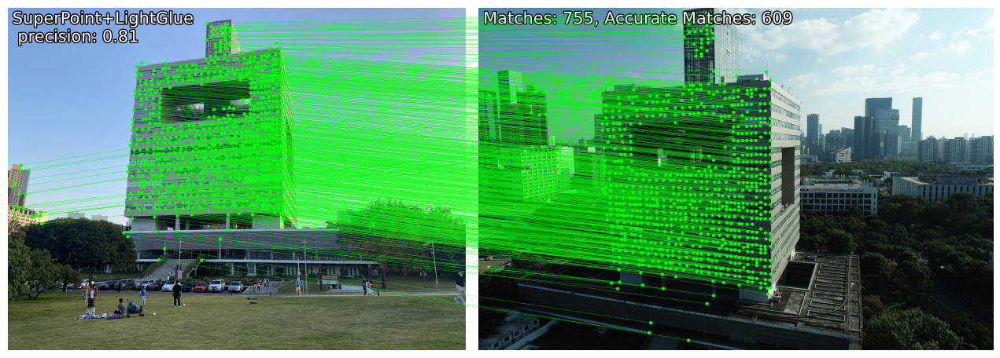

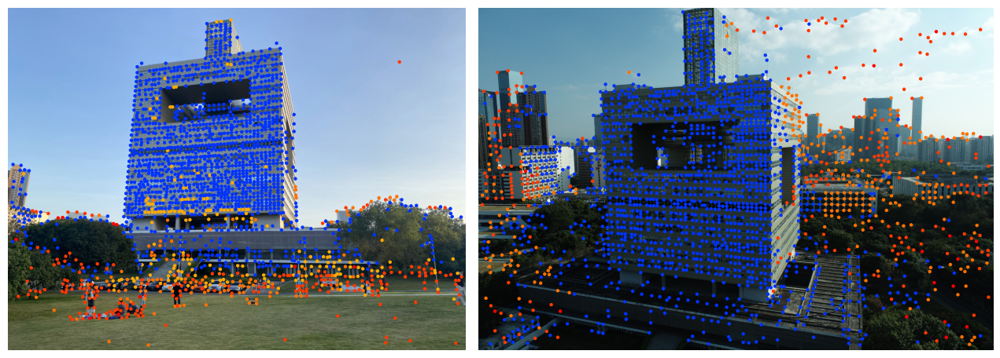

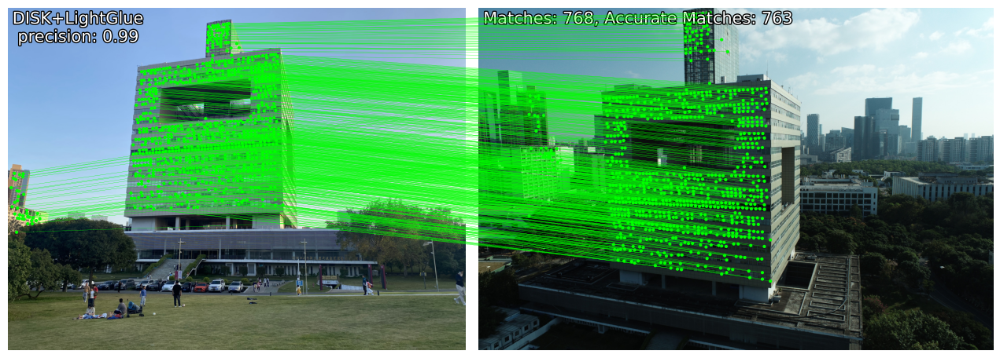

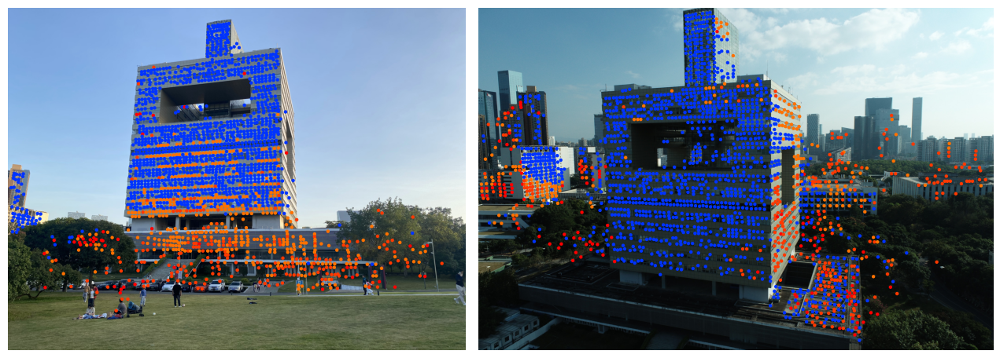

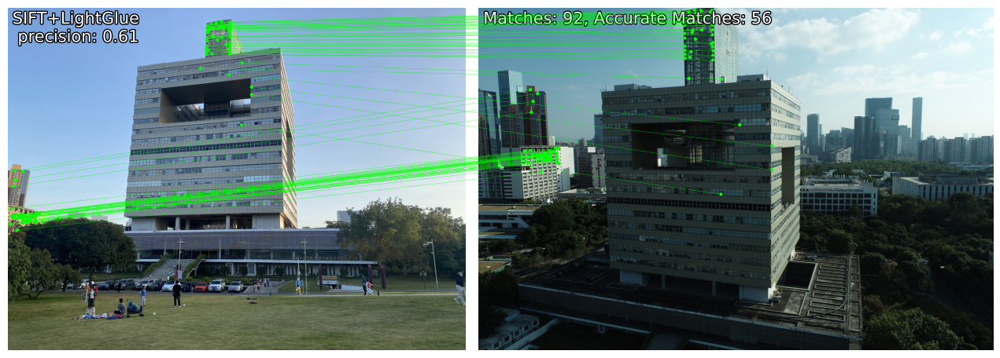

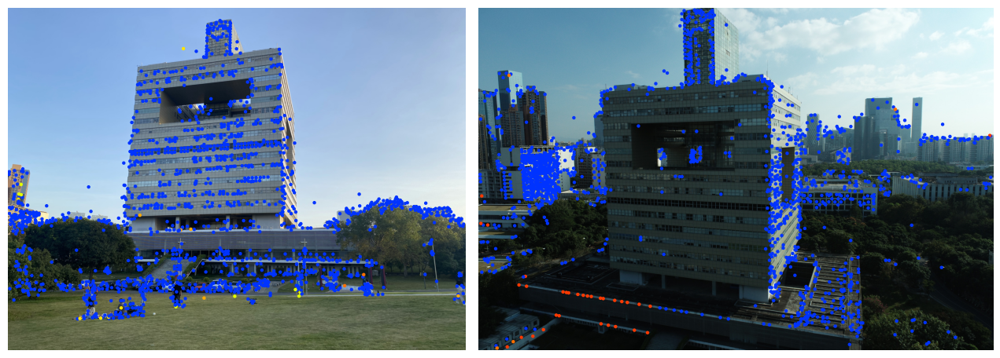

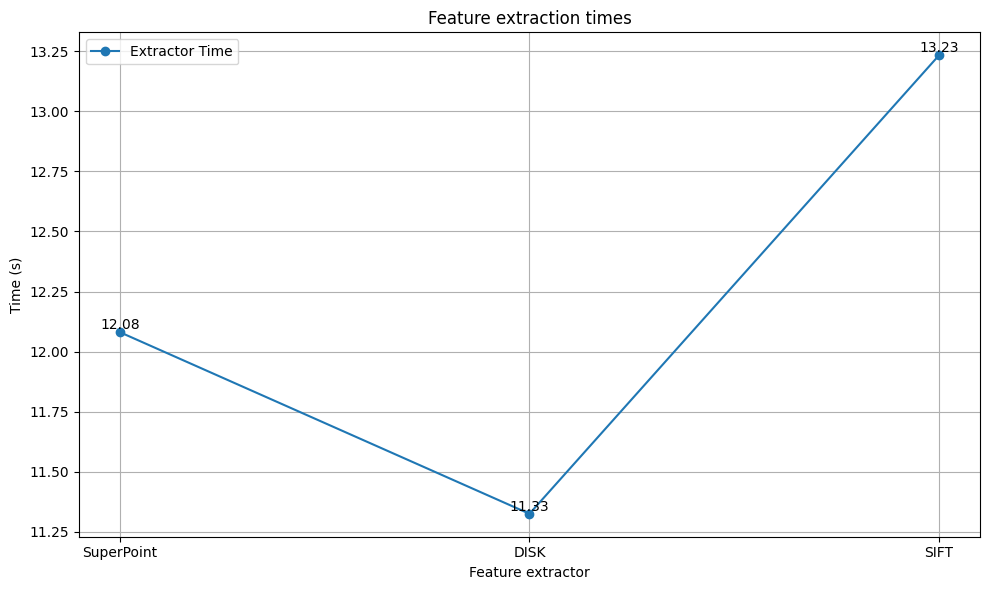

: 

In [16]:
import torch
import numpy as np
from pathlib import Path
from hloc.models.superpoint import SuperPoint  # 假设你有一个SuperPoint模块
from lightglue import LightGlue, SuperPoint, DISK ,SIFT, ALIKED, DoGHardNet,superglue   # 假设你有一个LightGlue模块
from lightglue.utils import load_image, rbd     # 假设你有一个utils模块，其中有load_image和viz2d函数
import cv2

import time
import matplotlib.pyplot as plt

# 加载图像
images = Path("assets")
image0 = load_image(images / "2_8686.jpg").cuda()
image1 = load_image(images / "frame_00184.JPG").cuda()

# 定义特征提取器和匹配器
extractors = {
    "SuperPoint": SuperPoint(max_num_keypoints=2048).eval().cuda(),
    "DISK": DISK(max_num_keypoints=2048).eval().cuda(),
    "SIFT": SIFT(max_num_keypoints=2048).eval().cuda()  ,
}

matchers = {
    "LightGlue": LightGlue(features='superpoint').eval().cuda(), 
}

# 评估结果保存路径
output_dir = Path("output/feature_matching")
output_dir.mkdir(parents=True, exist_ok=True)

# 比值测试阈值
cc = 1.3

fx, fy, cx, cy = 465.629,524.413,320.0,240.0
# 内参矩阵 (假设你的相机内参)
K = np.array([[fx, 0, cx],
              [0, fy, cy],
              [0, 0, 1]])
# 测量执行时间
extractor_times = {}
matcher_times = {}
for extractor_name, extractor in extractors.items():
    for matcher_name, matcher in matchers.items():
        #开始时间
        start_time = time.time()
        if extractor_name == "SIFT" and matcher_name != "SIFT":
            matcher=LightGlue(features='sift').eval().cuda()
        if extractor_name != "SIFT" and matcher_name == "SIFT":
            continue
        
        if extractor_name == "DISK":
            matcher=LightGlue(features='disk').eval().cuda()
        
        # 特征提
        # 特征匹配
        
        feats0, feats1, matches01 = match_pair(extractor, matcher, image0, image1)
        matches = matches01["matches"]
        kpts0, kpts1 = feats0["keypoints"], feats1["keypoints"]
        m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

        descs0, descs1 = feats0["descriptors"], feats1["descriptors"]
        # 比值测试
        good_matches = []
        for m_idx, n_idx in matches:
            distance = np.linalg.norm(descs0[m_idx] - descs1[n_idx])
            
            other_distances = np.linalg.norm(descs0[m_idx] - descs1, axis=1)
            other_distances = np.sort(other_distances)
            second_best_distance = other_distances[1]

            if distance < cc * second_best_distance:
                good_matches.append((m_idx, n_idx))

        num_accurate_matches = len(good_matches)
        num_matches = matches.shape[0]
        accuracy = num_accurate_matches / num_matches

        # 可视化匹配结果
        axes = viz2d.plot_images([image0, image1])
        viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
        viz2d.add_text(0, f'{extractor_name}+{matcher_name}\n precision: {accuracy:.2f}')
        viz2d.add_text(1, f'Matches: {num_matches}, Accurate Matches: {num_accurate_matches}')
        viz2d.save_plot(output_dir / f"{extractor_name}_{matcher_name}_matches.png")

        # 可视化修剪后的关键点
        if matcher_name != "SIFT":
            kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])
            viz2d.plot_images([image0, image1])
            viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)
            viz2d.save_plot(output_dir / f"{extractor_name}_{matcher_name}_keypoints.png")

        # 姿态估计
        pts0 = np.array([kpts0[m] for m in matches[:, 0]])
        pts1 = np.array([kpts1[m] for m in matches[:, 1]])

        E, mask = cv2.findEssentialMat(pts0, pts1, K, method=cv2.RANSAC, prob=0.999, threshold=1.0)
        _, R, t, mask_pose = cv2.recoverPose(E, pts0, pts1, K)

        # 保存姿态估计结果
        with open(output_dir / f"{extractor_name}_{matcher_name}_pose.txt", "w") as f:
            f.write(f"Rotation:\n{R}\nTranslation:\n{t}")

        print(f"Evaluated {extractor_name} with {matcher_name}. Results saved to {output_dir}")

        # 结束时间
        end_time = time.time()
        extractor_times[extractor_name] = end_time - start_time

plt.figure(figsize=(10, 6))
# 绘制特征提取器时间
plt.plot(list(extractor_times.keys()), list(extractor_times.values()), marker='o', label='Extractor Time')
plt.title("Feature extraction times")
plt.xlabel("Feature extractor")
plt.ylabel("Time (s)")
# 绘制特征匹配器时间
plt.legend()

for algorithm, time_value in extractor_times.items():
    plt.text(algorithm, time_value, f"{time_value:.2f}", ha='center', va='bottom')

plt.grid(True)
plt.tight_layout()

# 保存图像
plt.savefig('output/feature_matching/performance_comparison.png')

#plt.show()
print("All evaluations completed.")


